# IBM - Applied Data Science Capstone
## Recommend in a city with a higher population density and the best locality to opening of a restaurant

## Table of contents
* [Introduction: Business Problem](#introduction)
* [Data](#data)
* [Methodology](#methodology)
* [Analysis](#analysis)
* [Modeling](#modeling)
* [Results and Discussion](#results)
* [Conclusion](#conclusion)


## Introduction: Business problem <a name="introduction"></a>
Our client wishes to implement a restaurant in the state of New York, in order to determine the appropriate location that can guarantee the success of the business, our client considers the following aspects important: First, that the candidate cities must have a considerable population density ; second, to guarantee the influx of the public (customers) to have options for appropriate restaurant categories and finally to determine if there is competition in the market, taking into account those options that do not generate much competition.

### Objetive:
Recommend the appropriate location to create a new restaurant in the New York state, in order to guarantee the success of the business.

### Considerations:
* Cities with the highest population density in the state of New York, in order to guarantee the influx of the public.
* In a radius of 500 meters, consider up to 100 restaurants within the cities of New York State.
* Determine the top 10 of the most common restaurants, in order to identify the categories that do not have much competition in the market.


## Data <a name="data"></a>

Source: https://simplemaps.com/data/us-zips

Data: US Zip Codes Database 

Fields:

| fieldname | description |
| --- | --- |
| zip | The 5-digit zip code assigned by the U.S. Postal Service. |
| lat | The latitude of the zip code (learn more). 			
| lng | The longitude of the zip code (learn more). 			
| city | The official USPS city name. 			
| state_id | The official USPS state abbreviation. 			
| state_name | The state's name. 			
| zcta | TRUE if the zip code is a Zip Code Tabulation area (learn more). 			
| parent_zcta | The ZCTA that contains this zip code. Only exists if zcta is FALSE. Useful for making inferences about a zip codes that is a point from the ZCTA that contains it. 			
| population | An estimate of the zip code's population. Only exists if zcta is TRUE. 			
| density | The estimated population per square kilometer. Only exists if zcta is TRUE. 			
| county_fips | The zip's primary county in the FIPS format. 			
| county_name | The name of the county_fips. 			
| county_weights | A JSON dictionary listing all county_fips and their weights (by population) associated with the zip code. 			
| imprecise | TRUE if the lat/lng has been geolocated using the city (rare). 			
| military | TRUE if the zip code is used by the US Military (lat/lng not available). 			
| timezone | The city's time zone in the tz database format. (e.g. America/Los_Angeles)

We will work with data such as zipcode, density, longitude, latitude, city and state, which will be complemented with the information provided by Foursquare that will allow us to determine or recommend the appropriate location to implement the restaurant in New York City.


In [1]:
import pandas as pd
import numpy as np
from IPython.display import display_html
from geopy.geocoders import Nominatim # convert an address into latitude 

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors

# import k-means from clustering stage
from sklearn.cluster import KMeans

#!conda install -c conda-forge folium=0.5.0 --yes # uncomment this line if you haven't completed the Foursquare API lab
import folium # map rendering library

from bs4 import BeautifulSoup # this module helps in web scrapping.
import requests  # this module helps us to download a web page

from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns

print('Libraries imported.')

Libraries imported.


## Explore - Load Data From CSV File

Get the data in the next link: https://simplemaps.com/data/us-zips, this data is free modality and One-time fee "free".


In [2]:
data = pd.read_csv("uszips.csv")
data.head()

,zip,lat,lng,city,state_id,state_name,zcta,parent_zcta,population,density,county_fips,county_name,county_weights,county_names_all,county_fips_all,imprecise,military,timezone
0,601,18.18005,-66.75218,Adjuntas,PR,Puerto Rico,True,NaN,17113.0,102.7,72001,Adjuntas,"{""72001"": ""99.43"", ""72141"": ""0.57""}",Adjuntas|Utuado,72001|72141,False,False,America/Puerto_Rico
1,602,18.36074,-67.17519,Aguada,PR,Puerto Rico,True,NaN,37751.0,476.0,72003,Aguada,"{""72003"": ""100""}",Aguada,72003,False,False,America/Puerto_Rico
2,603,18.45440,-67.12201,Aguadilla,PR,Puerto Rico,True,NaN,47081.0,574.9,72005,Aguadilla,"{""72005"": ""100""}",Aguadilla,72005,False,False,America/Puerto_Rico
3,606,18.16721,-66.93828,Maricao,PR,Puerto Rico,True,NaN,6392.0,58.3,72093,Maricao,"{""72093"": ""94.88"", ""72153"": ""3.78"", ""72121"": ""...",Maricao|Yauco|Sabana Grande,72093|72153|72121,False,False,America/Puerto_Rico
4,610,18.29032,-67.12244,Anasco,PR,Puerto Rico,True,NaN,26686.0,286.9,72011,Añasco,"{""72011"": ""99.45"", ""72003"": ""0.55""}",Añasco|Aguada,72011|72003,False,False,America/Puerto_Rico


In [3]:
data.shape

(33121, 18)

## Data preparation

### Pre-processing

In [4]:
# Get all values for words "New York"
dfnewyork = data[data['state_name'].str.contains('New York')]
#df = data[data['city'].str.contains('New York')]
dfnewyork.head()

,zip,lat,lng,city,state_id,state_name,zcta,parent_zcta,population,density,county_fips,county_name,county_weights,county_names_all,county_fips_all,imprecise,military,timezone
1830,6390,41.27024,-71.98783,Fishers Island,NY,New York,True,NaN,125.0,11.9,36103,Suffolk,"{""36103"": ""100""}",Suffolk,36103,False,False,America/New_York
2569,10001,40.75065,-73.99718,New York,NY,New York,True,NaN,24117.0,15153.7,36061,New York,"{""36061"": ""100""}",New York,36061,False,False,America/New_York
2570,10002,40.71570,-73.98638,New York,NY,New York,True,NaN,74479.0,32735.5,36061,New York,"{""36061"": ""100""}",New York,36061,False,False,America/New_York
2571,10003,40.73180,-73.98911,New York,NY,New York,True,NaN,53977.0,36153.3,36061,New York,"{""36061"": ""100""}",New York,36061,False,False,America/New_York
2572,10004,40.69465,-74.02106,New York,NY,New York,True,NaN,3335.0,2391.1,36061,New York,"{""36061"": ""100""}",New York,36061,False,False,America/New_York


In [5]:
dfnewyork.shape

(1794, 18)

#### Consider up to 200 citys with major density

We will work on the first 200 cities with the highest density, considering that the main interest of the client is to open the restaurant where there is a higher population density.

In [6]:
df = dfnewyork.nlargest(200, 'density')
print(df.shape)
df.head(10)

(200, 18)


,zip,lat,lng,city,state_id,state_name,zcta,parent_zcta,population,density,county_fips,county_name,county_weights,county_names_all,county_fips_all,imprecise,military,timezone
2594,10028,40.77630,-73.95372,New York,NY,New York,True,NaN,46768.0,57641.1,36061,New York,"{""36061"": ""100""}",New York,36061,False,False,America/New_York
2621,10162,40.76931,-73.94993,New York,NY,New York,True,NaN,1486.0,49845.7,36061,New York,"{""36061"": ""100""}",New York,36061,False,False,America/New_York
2589,10023,40.77601,-73.98269,New York,NY,New York,True,NaN,62541.0,49276.1,36061,New York,"{""36061"": ""100""}",New York,36061,False,False,America/New_York
2617,10128,40.78138,-73.95016,New York,NY,New York,True,NaN,58636.0,48612.5,36061,New York,"{""36061"": ""100""}",New York,36061,False,False,America/New_York
2591,10025,40.79857,-73.96659,New York,NY,New York,True,NaN,92251.0,47387.6,36061,New York,"{""36061"": ""100""}",New York,36061,False,False,America/New_York
2610,10075,40.77335,-73.95622,New York,NY,New York,True,NaN,22252.0,46636.5,36061,New York,"{""36061"": ""100""}",New York,36061,False,False,America/New_York
2835,11109,40.74589,-73.95751,Long Island City,NY,New York,True,NaN,5980.0,46394.4,36081,Queens,"{""36081"": ""100""}",Queens,36081,False,False,America/New_York
2573,10005,40.70614,-74.00891,New York,NY,New York,True,NaN,8701.0,46219.5,36061,New York,"{""36061"": ""100""}",New York,36061,False,False,America/New_York
2606,10040,40.85821,-73.93053,New York,NY,New York,True,NaN,44800.0,45321.7,36061,New York,"{""36061"": ""100""}",New York,36061,False,False,America/New_York
2587,10021,40.76939,-73.95871,New York,NY,New York,True,NaN,44280.0,44872.8,36061,New York,"{""36061"": ""100""}",New York,36061,False,False,America/New_York


### Data cleaning

Data cleaning process, in this particular case "US Zip Codes Database", with the aim of eliminating noise in the information, generating unnecessary variation, for that purpose cases such as duplicate columns, duplicate rows and identification of incomplete data have been treated. or lost.

#### Remove duplicate columns

In [7]:
df = df.loc[:,~df.columns.duplicated()]
df.shape

(200, 18)

#### Remove duplicate rows

In [8]:
df.drop_duplicates(subset=None, inplace=True)
df.shape

(200, 18)

#### Identifying missin data 

In [46]:
def get_porcentaje_isnullbycolumn(dataframe):
    for column in dataframe.columns:
        #print('Column Name: ' + column + ' - % Nulls: ' + df[column].isnull().sum()/df[column].count() * 100)
        porcentaje = (dataframe[column].isnull().sum()/dataframe[column].count()) * 100
        if (porcentaje > 0):
            print('Column Name: ' + column + ' - % Nulls: ' + '{:10.4f}%'.format(porcentaje))
        print("There isn't null data")


get_porcentaje_isnullbycolumn(df)

There isn't null data
There isn't null data
There isn't null data
There isn't null data
There isn't null data
There isn't null data
There isn't null data
Column Name: parent_zcta - % Nulls:        inf%
There isn't null data
There isn't null data
There isn't null data
There isn't null data
There isn't null data
There isn't null data
There isn't null data
There isn't null data
There isn't null data
There isn't null data
There isn't null data
<ipython-input-46-a9ed15a4898f>:4: RuntimeWarning: divide by zero encountered in longlong_scalars
  porcentaje = (dataframe[column].isnull().sum()/dataframe[column].count()) * 100


In [8]:
# Data was cleaning.
df.head()

,zip,lat,lng,city,state_id,state_name,zcta,parent_zcta,population,density,county_fips,county_name,county_weights,county_names_all,county_fips_all,imprecise,military,timezone
2594,10028,40.77630,-73.95372,New York,NY,New York,True,NaN,46768.0,57641.1,36061,New York,"{""36061"": ""100""}",New York,36061,False,False,America/New_York
2621,10162,40.76931,-73.94993,New York,NY,New York,True,NaN,1486.0,49845.7,36061,New York,"{""36061"": ""100""}",New York,36061,False,False,America/New_York
2589,10023,40.77601,-73.98269,New York,NY,New York,True,NaN,62541.0,49276.1,36061,New York,"{""36061"": ""100""}",New York,36061,False,False,America/New_York
2617,10128,40.78138,-73.95016,New York,NY,New York,True,NaN,58636.0,48612.5,36061,New York,"{""36061"": ""100""}",New York,36061,False,False,America/New_York
2591,10025,40.79857,-73.96659,New York,NY,New York,True,NaN,92251.0,47387.6,36061,New York,"{""36061"": ""100""}",New York,36061,False,False,America/New_York


In [9]:
df.shape

(200, 18)

### Feature selection

#### Descriptive statistics

Due to the restriction of this exercise, which is to take into account the population density, and also considering the descriptive statistics of the data, which helps us to consider the density and population fields.

In [47]:
df.describe()

,zip,lat,lng,parent_zcta,population,density,county_fips
count,200.00000,200.000000,200.000000,0.0,200.000000,200.000000,200.00000
mean,11007.97500,40.872002,-74.065843,NaN,43704.475000,16431.279000,36061.33000
std,900.15502,0.521784,0.851765,NaN,27168.485187,12260.765906,28.43084
min,10001.00000,40.551520,-79.049190,NaN,42.000000,3702.000000,36001.00000
25%,10309.50000,40.684083,-73.975142,NaN,22897.750000,5934.475000,36047.00000
50%,11204.50000,40.740815,-73.915095,NaN,38996.000000,12840.500000,36061.00000
75%,11373.25000,40.818865,-73.827967,NaN,63255.000000,23398.025000,36081.00000
max,14853.00000,43.150810,-73.125140,NaN,112088.000000,57641.100000,36119.00000


#### Correlation analysis

From the graph that determines the correlation between the variables on each axis, it can be interpreted, considering the density and population variables which will be subject to analysis, we can identify that their correlation is low.

(10.5, -0.5)

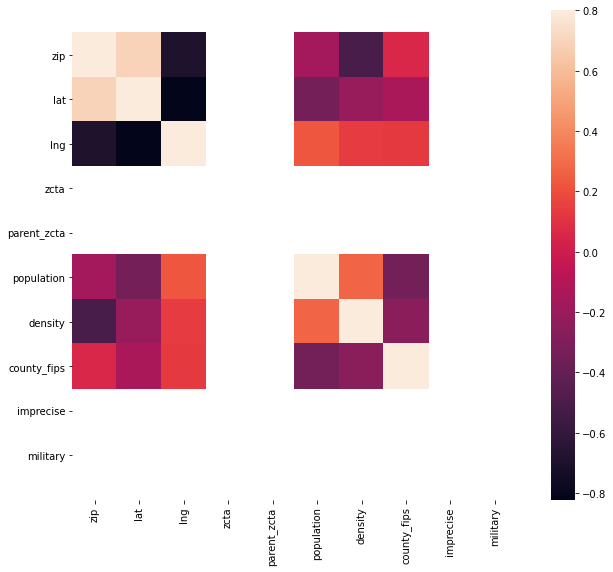

In [51]:
# Correlation matrix.
corrmat = df.corr()
f, ax = plt.subplots(figsize=(12, 9))
sns.heatmap(corrmat, vmax=.8, square=True);
bottom, top = ax.get_ylim()
ax.set_ylim(bottom+0.5, top-0.5)

#### Distribution analysis

From the graph we can interpret the dispersion with respect to the IQR (Inter-Quartile Range) that measures the variability of 50% of the data, specifically considering New York and Bronx (which can be seen), it can be interpreted that the variability of New York it is greater than the variability of the Bronx. Regarding the median which represents the distribution of the data, it can be said that New York has a positive asymmetric distribution or positively skewed upwards, with respect to Bronx, it can be said that the median is almost in the center therefore its data distribution is nearly symmetric.

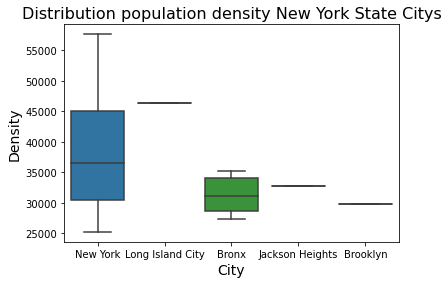

In [64]:
boxplot = sns.boxplot(x="city", y="density", data=df.head(40))
boxplot.axes.set_title("Distribution population density New York State Citys", fontsize=16)
boxplot.set_xlabel("City", fontsize=14)
boxplot.set_ylabel("Density", fontsize=14)
plt.show()

### Create a map of New York

In [10]:
address = 'New York'

geolocator = Nominatim(user_agent="ny_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of New York City are {}, {}.'.format(latitude, longitude))

The geograpical coordinate of New York City are 40.7127281, -74.0060152.


In [11]:
map_newyork = folium.Map(location=[latitude, longitude], zoom_start=10)

for lat,lng,state_name,city in zip(df['lat'],df['lng'],df['state_name'],df['city']):
    label = '{}, {}'.format(state_name, city)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
    [lat,lng],
    radius=5,
    popup=label,
    color='blue',
    fill=True,
    fill_color='#3186cc',
    fill_opacity=0.7,
    parse_html=False).add_to(map_newyork)
map_newyork

## Methodology <a name="methodology"></a>

In the article titled "Understanding and projecting the restaurantscape: Influence of neighborhood
sociodemographic characteristics on restaurant location ", August 2017, written by Yang Yang and Jing-Huei Huang, at: https://www.researchgate.net/publication/318813299, mention that to understand the location patterns of different types of restaurants In the United States, they investigated the relationship between sociodemographic characteristics, in which they reflect the impact generated by sociodemographic factors such as population density, middle age of the population, educational level, etc., taking into account the aforementioned as a theoretical basis, In this exercise, the density of the population and population will be taken into account, considering the variables that our data comprises.

After having the data "US Zip Codes Database", and after having taken into account the state "New York" up to this point we have already processed:
* The first 200 cities with the highest population density in order to determine the recommended location to open the restaurant.
Now we will proceed with other activities such as:
* Obtain information from the Forsquare API to obtain up to 100 existing restaurants within a radius of 500 meters.
* To contribute to the analysis, classify restaurants by category to determine frequency by city.
* Determine the 10 cities with the highest population density, in order to subsequently select the cities that are within the top 10.
* We will focus on the most promising areas and within them we will create groups of locations focused on recommending the best place to implement a restaurant: After obtaining up to 100 restaurants within a radius of 500 meters, we will later present a map of all those locations .
* Determine the top 10 restaurant categories for each city and town.
* We will proceed with the cluster applying k-means grouping of those locations to identify the locality, for the exploitation of the optimal location where we will recommend the implementation of a restaurant.
* To recommend, the k-means result should be restricted to the cities with the highest population density.

## Analysis <a name="analysis"></a>

### New York State density and population distribution
The visualization of the distribution of the density and the population of the state of New York is carried out, in order to validate the requirement of the clients, who demand that a restaurant be created in cities with higher population density and therefore a considerable population.

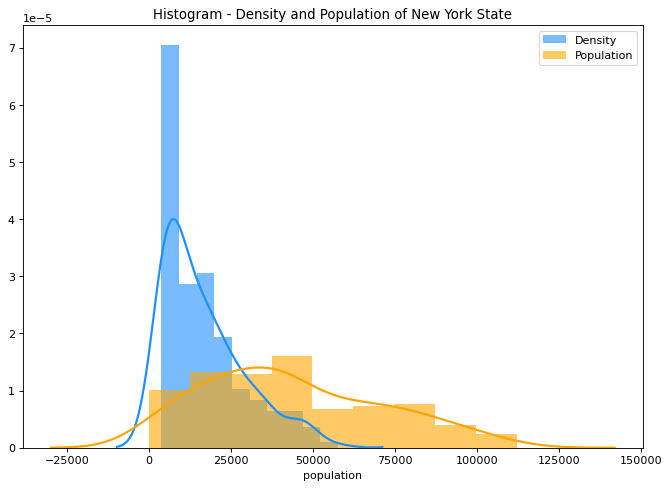

In [12]:
# Get data with specific columns from data "US Zip Codes Database"
dfdensity = df[["city","density", "population"]]

# Graphic
kwargs = dict(hist_kws={'alpha':.6}, kde_kws={'linewidth':2})
plt.figure(figsize=(10,7), dpi= 80)
sns.distplot(dfdensity["density"], color="dodgerblue", label="Density", **kwargs)
sns.distplot(dfdensity["population"], color="orange", label="Population", **kwargs)
#sns.distplot(x3, color="deeppink", label="minivan", **kwargs)
#plt.xlim(50,75)
plt.title("Histogram - Density and Population of New York State")
plt.legend();

### New York State Citys density
After validating the population density and population of the state of New York, only the population density can be considered by the shape of the distribution, which reveals the existence of cities that have a significant greater population density. Next, the distribution of the population density of the cities of the state of New York is visualized and analyzed.

In [13]:
# Get data with group by city
dfdensity_grouped = df[["city","density"]].groupby('city').mean().reset_index()
dfdensity_grouped.head()

,city,density
0,Albany,4296.85
1,Ardsley On Hudson,3974.30
2,Arverne,8501.00
3,Astoria,14902.15
4,Auburn,15886.30


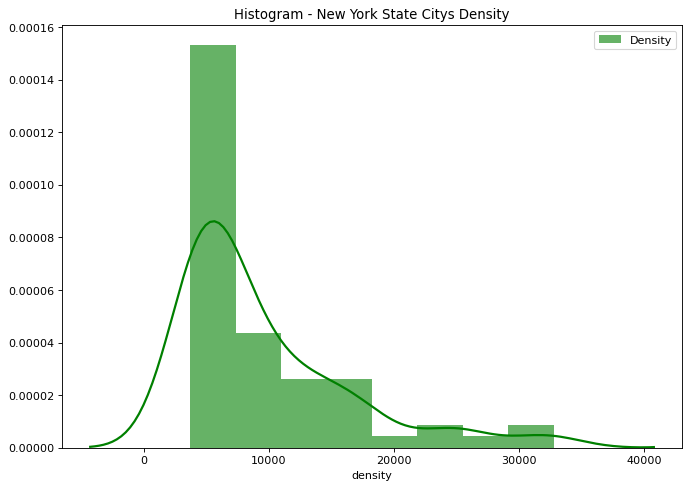

In [14]:
# Graphic
kwargs = dict(hist_kws={'alpha':.6}, kde_kws={'linewidth':2})
plt.figure(figsize=(10,7), dpi= 80)
sns.distplot(dfdensity_grouped["density"], color="green", label="Density", **kwargs)
#plt.xlim(8000, 16000)
plt.title("Histogram - New York State Citys Density")
plt.legend();

### Get data from API Forsquare - The 100 restaurants within a radius of 500 kilometers
Get data from API Forsquare with the information from database "US Zip Codes Database".

In [15]:
CLIENT_ID = 'BA5J1IGIZHMXYWWZCCCWQSL4FS54NSYAWVWVGYDO52V5AJGI' # your Foursquare ID
CLIENT_SECRET = 'EOOJYAG35MBQZ0KDYAOAG2MA0C51IZDS01ZLGRHZD0TW1JQP' # your Foursquare Secret
VERSION = '20180605' # Foursquare API version
LIMIT = 100 # A default Foursquare API limit value

print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

Your credentails:
CLIENT_ID: BA5J1IGIZHMXYWWZCCCWQSL4FS54NSYAWVWVGYDO52V5AJGI
CLIENT_SECRET:EOOJYAG35MBQZ0KDYAOAG2MA0C51IZDS01ZLGRHZD0TW1JQP


In [16]:
# type your answer here
radius = 500
LIMIT = 1
url = 'https://api.foursquare.com/v2/venues/explore?client_id={0}&client_secret={1}&ll={2},{3}&v={4}&radius={5}&limit={6}&query=restaurant'.format(CLIENT_ID, CLIENT_SECRET, latitude, longitude, VERSION, radius, LIMIT)

results = requests.get(url).json()
results

{'meta': {'code': 200, 'requestId': '60aae35d5a12365733119a3d'},
 'response': {'suggestedFilters': {'header': 'Tap to show:',
   'filters': [{'name': '$-$$$$', 'key': 'price'},
    {'name': 'Open now', 'key': 'openNow'}]},
  'warning': {'text': 'There aren\'t a lot of results for "restaurant." Try something more general, reset your filters, or expand the search area.'},
  'headerLocation': 'Downtown Manhattan',
  'headerFullLocation': 'Downtown Manhattan, New York',
  'headerLocationGranularity': 'neighborhood',
  'query': 'restaurant',
  'totalResults': 92,
  'suggestedBounds': {'ne': {'lat': 40.7172281045, 'lng': -74.00008952063419},
   'sw': {'lat': 40.7082280955, 'lng': -74.0119408793658}},
  'groups': [{'type': 'Recommended Places',
    'name': 'recommended',
    'items': [{'reasons': {'count': 0,
       'items': [{'summary': 'This spot is popular',
         'type': 'general',
         'reasonName': 'globalInteractionReason'}]},
      'venue': {'id': '4c154c9a77cea593c401d260',
  

In [18]:
# New parameters
radius = 500
LIMIT = 100
url = 'https://api.foursquare.com/v2/venues/explore?client_id={0}&client_secret={1}&ll={2},{3}&v={4}&radius={5}&limit={6}&query=restaurant'.format(CLIENT_ID, CLIENT_SECRET, latitude, longitude, VERSION, radius, LIMIT)

In [21]:
# function that extracts the category of the venue
def get_category_type(row):
    try:
        categories_list = row['categories']
    except:
        categories_list = row['venue.categories']
        
    if len(categories_list) == 0:
        return None
    else:
        return categories_list[0]['name']



# function extract nearby venues
venues = results['response']['groups'][0]['items']
    
nearby_venues = json_normalize(venues) # flatten JSON

# filter columns
filtered_columns = ['venue.name', 'venue.categories', 'venue.location.lat', 'venue.location.lng']
nearby_venues =nearby_venues.loc[:, filtered_columns]

# filter the category for each row
nearby_venues['venue.categories'] = nearby_venues.apply(get_category_type, axis=1)

# clean columns
nearby_venues.columns = [col.split(".")[-1] for col in nearby_venues.columns]

nearby_venues.head()


<ipython-input-21-9b9ffa8b67ca>:18: FutureWarning: pandas.io.json.json_normalize is deprecated, use pandas.json_normalize instead
  nearby_venues = json_normalize(venues) # flatten JSON


,name,categories,lat,lng
0,Takahachi Bakery,Bakery,40.713653,-74.008804


In [23]:
def getNearbyVenues(names, latitudes, longitudes, radius=500):
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={0}&client_secret={1}&v={2}&ll={3},{4}&radius={5}&limit={6}&query=restaurant'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        #["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['location', 
                  'latitude', 
                  'longitude', 
                  'venue', 
                  'venue_latitude', 
                  'venue_longitude', 
                  'venue_category']
    
    return(nearby_venues)

#### Result data from Foursquare

In [18]:
# Data after consuming API Forsquare.
newyork_venues = getNearbyVenues(names=df['city'],
                                   latitudes=df['lat'],
                                   longitudes=df['lng']
                                  )

In [19]:
print(newyork_venues.shape)
newyork_venues.head(10)

(6685, 7)


,location,latitude,longitude,venue,venue_latitude,venue_longitude,venue_category
0,New York,40.7763,-73.95372,Levain Bakery,40.777354,-73.955284,Bakery
1,New York,40.7763,-73.95372,Elio's,40.776783,-73.952736,Italian Restaurant
2,New York,40.7763,-73.95372,Luke's Lobster,40.774805,-73.954423,Seafood Restaurant
3,New York,40.7763,-73.95372,Schaller's Stube Sausage Bar,40.777588,-73.951975,Hot Dog Joint
4,New York,40.7763,-73.95372,Heidelberg Restaurant,40.777532,-73.951979,German Restaurant
5,New York,40.7763,-73.95372,San Matteo Pizzeria e Cucina,40.774674,-73.954221,Italian Restaurant
6,New York,40.7763,-73.95372,The Penrose,40.775444,-73.953143,Gastropub
7,New York,40.7763,-73.95372,Italianissimo Ristorante,40.776351,-73.952179,Italian Restaurant
8,New York,40.7763,-73.95372,H&H Midtown Bagels East,40.774446,-73.954479,Bagel Shop
9,New York,40.7763,-73.95372,Flex Mussels,40.776337,-73.956430,Seafood Restaurant


### Frequency of restaurants by city based on "Foursquare" data

The top 10 is determined, the top 10 with high frequency of restaurants by city.

In [54]:
newyork_venues_freqloc = newyork_venues[['location', 'venue']].groupby('location').count().reset_index()
print(newyork_venues_freqloc.shape)

newyork_venues_freqloc = newyork_venues_freqloc.rename(columns = {'venue': 'freq'}, inplace = False)
newyork_venues_freqloc.sort_values(by=["freq"], ascending=False, inplace=True)
newyork_venues_freqloc.head(10)

(62, 2)


,location,freq
35,New York,3296
7,Brooklyn,1292
6,Bronx,412
2,Astoria,151
17,Flushing,98
30,Long Island City,91
27,Jamaica,90
4,Bayside,83
13,Elmhurst,75
26,Jackson Heights,71


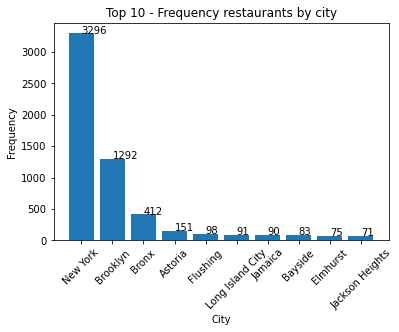

In [151]:
## For frequency restaurants from "Forsquare".
# Bar chart
newyork_venues_freqloc_top = newyork_venues_freqloc.head(10)
plt.bar(newyork_venues_freqloc_top["location"], newyork_venues_freqloc_top["freq"])
plt.xticks(rotation=45)
plt.title("Top 10 - Frequency restaurants by city")
plt.xlabel("City")
plt.ylabel("Frequency")

for index, value in enumerate(newyork_venues_freqloc_top["freq"]):
    plt.text(index, value, "{:}".format(value))

### The highest population density from data "US Zip Codes Database"

Obtaining the first 10 cities with the highest population density, they consider that it is intended to open the restaurant under this restriction.

In [32]:
# Top 10 citys by density.
city_density = df[['city', 'density']].groupby('city').sum().reset_index()
city_density = city_density.rename(columns={"city": "location"}, inplace=False)
city_density = city_density.sort_values("density", ascending=False)
city_density = city_density.head(10)
city_density

,location,density
36,New York,1412008.4
8,Brooklyn,617245.1
7,Bronx,426312.4
3,Astoria,59608.6
28,Jamaica,52757.7
31,Long Island City,51045.9
18,Flushing,41525.7
27,Jackson Heights,32758.7
53,Staten Island,29333.0
39,Ozone Park,26411.0


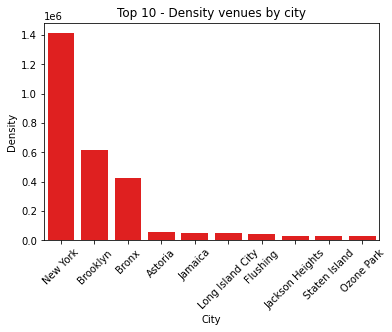

In [44]:
## For frequency restaurants from "US Zip Codes Database".
# Bar chart
sns.barplot(city_density["location"], city_density["density"], color="red", ci = None, data = city_density)
plt.xticks(rotation=45)
plt.title("Top 10 - Density venues by city")
plt.xlabel("City")
plt.ylabel("Density")
plt.show()

## Modeling

K-means is an unsupervised classification algorithm that groups objects into k groups based on their characteristics, the groupings are performed by minimizing the sum of distances between each object and the centroid of its subset or cluster.

There are many types of clustering algorithms, such as partitioning, hierarchical grouping or density-based, in this particular case K-Means is a type of partition grouping, which means that it divides the data into k subsets or groupings that are not they overlap and also without any structure or internal grouping labels. The objects within a cluster (subset) are very similar, and the objects in different clusters are very different. Therefore, it means that it is an unsupervised algorithm.

### Clustering

In this section, the type of restaurant and the 10 most representative will be taken into account, therefore we proceed by grouping rows by location and taking the mean of the frequency of occurrence of each category, preparing the data frame for grouping.

It is important to consider the transformation of the information collected using the one-hot encoding method.

In [101]:
# one hot encoding
newyork_onehot = pd.get_dummies(newyork_venues[['venue_category']], prefix="", prefix_sep="")

# add location column back to dataframe
newyork_onehot['location'] = newyork_venues['location'] 

# move location column to the first column
fixed_columns = [newyork_onehot.columns[-1]] + list(newyork_onehot.columns[:-1])
newyork_onehot = newyork_onehot[fixed_columns]

newyork_onehot.head(10)

,location,Afghan Restaurant,African Restaurant,American Restaurant,Arepa Restaurant,Argentinian Restaurant,Asian Restaurant,Australian Restaurant,Austrian Restaurant,BBQ Joint,...,Theme Restaurant,Tibetan Restaurant,Turkish Restaurant,Udon Restaurant,Ukrainian Restaurant,Vegetarian / Vegan Restaurant,Venezuelan Restaurant,Vietnamese Restaurant,Wings Joint,Xinjiang Restaurant
0,New York,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,New York,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,New York,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,New York,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,New York,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,New York,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,New York,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,New York,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,New York,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,New York,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [102]:
newyork_onehot.shape

(6685, 137)

In [103]:
newyork_grouped = newyork_onehot.groupby('location').mean().reset_index()
newyork_grouped.head(10)

,location,Afghan Restaurant,African Restaurant,American Restaurant,Arepa Restaurant,Argentinian Restaurant,Asian Restaurant,Australian Restaurant,Austrian Restaurant,BBQ Joint,...,Theme Restaurant,Tibetan Restaurant,Turkish Restaurant,Udon Restaurant,Ukrainian Restaurant,Vegetarian / Vegan Restaurant,Venezuelan Restaurant,Vietnamese Restaurant,Wings Joint,Xinjiang Restaurant
0,Albany,0.000000,0.0,0.000000,0.000000,0.000000,0.076923,0.0,0.0,0.000000,...,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0
1,Arverne,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,...,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0
2,Astoria,0.013245,0.0,0.000000,0.006623,0.000000,0.000000,0.0,0.0,0.006623,...,0.0,0.0,0.000000,0.000000,0.0,0.006623,0.000000,0.000000,0.000000,0.0
3,Auburn,0.000000,0.0,0.125000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,...,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0
4,Bayside,0.000000,0.0,0.048193,0.000000,0.000000,0.024096,0.0,0.0,0.000000,...,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.012048,0.000000,0.0
5,Bellerose,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,...,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0
6,Bronx,0.000000,0.0,0.016990,0.000000,0.000000,0.009709,0.0,0.0,0.004854,...,0.0,0.0,0.000000,0.000000,0.0,0.002427,0.000000,0.002427,0.002427,0.0
7,Brooklyn,0.000000,0.0,0.020898,0.001548,0.000774,0.016254,0.0,0.0,0.001548,...,0.0,0.0,0.003096,0.001548,0.0,0.006192,0.000774,0.003096,0.000774,0.0
8,Buffalo,0.000000,0.0,0.030303,0.000000,0.000000,0.030303,0.0,0.0,0.000000,...,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.030303,0.000000,0.0
9,Cambria Heights,0.000000,0.0,0.000000,0.000000,0.000000,0.111111,0.0,0.0,0.000000,...,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0


In [104]:
newyork_grouped.shape

(62, 137)

And check if Foursquare API did not return restaurants for some locations.

In [105]:
df.shape[0]

200

In [106]:
x = newyork_venues[['location', 'venue']].groupby('location').count().shape[0]
y = df.shape[0]
empty_locations = []
if x != y:
    print('Missing data for {0} locations:'.format(y-x))
    # And print them
    for i in range(df.shape[0]):
        loc = df.iloc[i,3]
        k = 0
        for j in range(newyork_venues.shape[0]):
            if loc == newyork_venues.iloc[j,0]:
                k += 1
        if k == 0:
            print(i,loc)
            empty_locations.append(loc)

Missing data for 138 locations:
190 Ardsley On Hudson


In [166]:
empty_locations

['Ardsley On Hudson']

#### Top 10 restaurants

Now let's create the new dataframe and display the top 10 restaurants for each location.

In [107]:
# Function to sort the venues in descending order
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

In [108]:
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['location']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
newyork_venues_sorted = pd.DataFrame(columns=columns)
newyork_venues_sorted['location'] = newyork_grouped['location']

for ind in np.arange(newyork_grouped.shape[0]):
    newyork_venues_sorted.iloc[ind, 1:] = return_most_common_venues(newyork_grouped.iloc[ind, :], num_top_venues)

newyork_venues_sorted

,location,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Albany,Salad Place,Caribbean Restaurant,Sandwich Place,Italian Restaurant,Burrito Place,Snack Place,Comfort Food Restaurant,Asian Restaurant,Restaurant,Café
1,Arverne,Deli / Bodega,Donut Shop,Sandwich Place,Falafel Restaurant,Food,Fondue Restaurant,Fish & Chips Shop,Filipino Restaurant,Fast Food Restaurant,English Restaurant
2,Astoria,Deli / Bodega,Pizza Place,Chinese Restaurant,Sushi Restaurant,Italian Restaurant,Greek Restaurant,Mexican Restaurant,Café,Bakery,Donut Shop
3,Auburn,Food,Pizza Place,Gastropub,Mexican Restaurant,Restaurant,American Restaurant,Donut Shop,Dumpling Restaurant,Eastern European Restaurant,Empanada Restaurant
4,Bayside,Korean Restaurant,Pizza Place,Mexican Restaurant,Bakery,American Restaurant,Indian Restaurant,Chinese Restaurant,Sushi Restaurant,Donut Shop,Restaurant
...,...,...,...,...,...,...,...,...,...,...,...
57,White Plains,Italian Restaurant,Pizza Place,Sandwich Place,Chinese Restaurant,Japanese Restaurant,Latin American Restaurant,Seafood Restaurant,American Restaurant,Steakhouse,Mexican Restaurant
58,Whitestone,Italian Restaurant,Diner,Deli / Bodega,Pizza Place,Japanese Restaurant,Bakery,Sushi Restaurant,Salad Place,Sandwich Place,Chinese Restaurant
59,Woodhaven,Deli / Bodega,Pizza Place,Restaurant,Chinese Restaurant,Mexican Restaurant,Latin American Restaurant,Bakery,Diner,Empanada Restaurant,Fast Food Restaurant
60,Woodside,Pizza Place,Latin American Restaurant,Bakery,Thai Restaurant,Donut Shop,Chinese Restaurant,Café,Restaurant,Japanese Restaurant,Food Truck


In [109]:
newyork_venues_sorted.shape

(62, 11)

### Cluster applying k-means

Preparing data for clustering

In [110]:
# Drop column "location"
newyork_grouped_clustering = newyork_grouped.drop('location', 1)

print(newyork_grouped_clustering.shape)
newyork_grouped_clustering.head(10)

(62, 136)


,Afghan Restaurant,African Restaurant,American Restaurant,Arepa Restaurant,Argentinian Restaurant,Asian Restaurant,Australian Restaurant,Austrian Restaurant,BBQ Joint,Bagel Shop,...,Theme Restaurant,Tibetan Restaurant,Turkish Restaurant,Udon Restaurant,Ukrainian Restaurant,Vegetarian / Vegan Restaurant,Venezuelan Restaurant,Vietnamese Restaurant,Wings Joint,Xinjiang Restaurant
0,0.000000,0.0,0.000000,0.000000,0.000000,0.076923,0.0,0.0,0.000000,0.000000,...,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0
1,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,...,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0
2,0.013245,0.0,0.000000,0.006623,0.000000,0.000000,0.0,0.0,0.006623,0.019868,...,0.0,0.0,0.000000,0.000000,0.0,0.006623,0.000000,0.000000,0.000000,0.0
3,0.000000,0.0,0.125000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,...,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0
4,0.000000,0.0,0.048193,0.000000,0.000000,0.024096,0.0,0.0,0.000000,0.012048,...,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.012048,0.000000,0.0
5,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,...,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0
6,0.000000,0.0,0.016990,0.000000,0.000000,0.009709,0.0,0.0,0.004854,0.004854,...,0.0,0.0,0.000000,0.000000,0.0,0.002427,0.000000,0.002427,0.002427,0.0
7,0.000000,0.0,0.020898,0.001548,0.000774,0.016254,0.0,0.0,0.001548,0.033282,...,0.0,0.0,0.003096,0.001548,0.0,0.006192,0.000774,0.003096,0.000774,0.0
8,0.000000,0.0,0.030303,0.000000,0.000000,0.030303,0.0,0.0,0.000000,0.000000,...,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.030303,0.000000,0.0
9,0.000000,0.0,0.000000,0.000000,0.000000,0.111111,0.0,0.0,0.000000,0.000000,...,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0


#### Getting the best "k" applying elbow method

The "elbow" method is a common heuristic in mathematical optimization, allowing you to select a point at which diminishing returns no longer justify the additional cost, being an inflection point in the ignorable decreasing part. This selection makes it possible to provide a much better model for the data.

With the "elbow" method, the optimal number of clusters is selected by adjusting the model with a range of values for K, which consists of checking the inflection point in the curve, this parameter definitely applicable to the model for its best fit.

In [113]:
distortions = []
K = range(1,10+1)
for k in K:
    kmeanModel = KMeans(n_clusters=k)
    kmeanModel.fit(newyork_grouped_clustering)
    distortions.append(kmeanModel.inertia_)

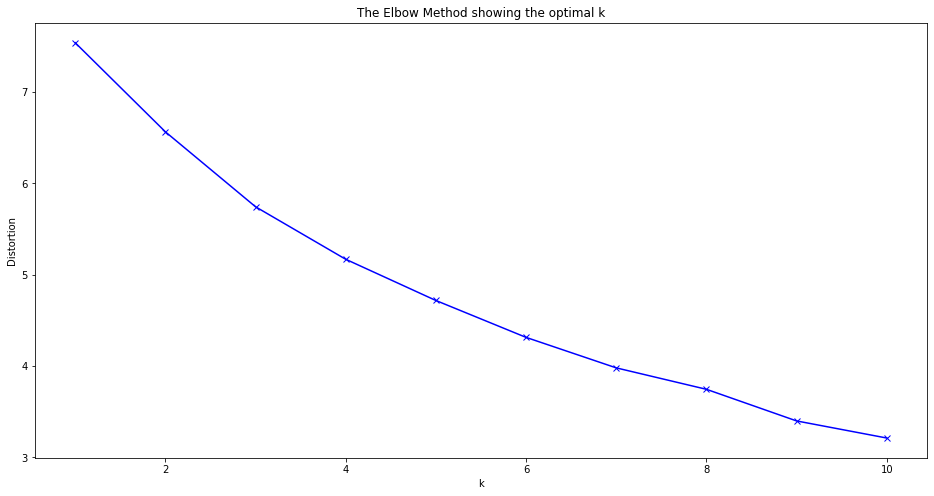

In [114]:
plt.figure(figsize=(16,8))
plt.plot(K, distortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the optimal k')
plt.show()

C:\Users\jhimy\anaconda3\lib\site-packages\sklearn\base.py:209: FutureWarning: From version 0.24, get_params will raise an AttributeError if a parameter cannot be retrieved as an instance attribute. Previously it would return None.
  warnings.warn('From version 0.24, get_params will raise an '


KElbowVisualizer(ax=<matplotlib.axes._subplots.AxesSubplot object at 0x00000198D1FDDA00>,
                 estimator=KMeans(n_clusters=10), k=None)

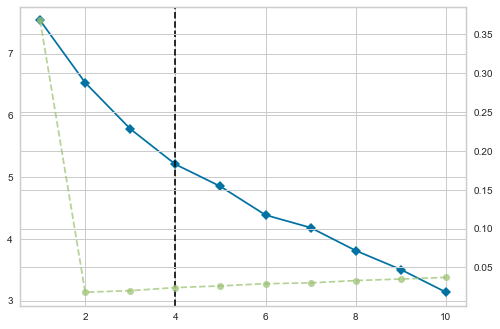

In [213]:
from yellowbrick.cluster import KElbowVisualizer

# Instantiate the clustering model and visualizer
model = KMeans()
visualizer = KElbowVisualizer(model, k=(1, 11))

visualizer.fit(newyork_grouped_clustering)
visualizer

The value of k at the “elbow” ie the point after which the distortion/inertia start decreasing in a linear fashion. Therefor the value K = 4

#### Running processing with K-means

After finding the recommended k, the execution (fit) proceeds applying K-means with k = 4, resulting after segmentation into 4 subsets or clusters.

In [115]:
# set number of clusters
kclusters = 4

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(newyork_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10] 

array([2, 3, 2, 2, 2, 3, 2, 2, 2, 0])

In [116]:
kmeans.labels_

array([2, 3, 2, 2, 2, 3, 2, 2, 2, 0, 2, 2, 2, 0, 2, 3, 2, 0, 2, 2, 2, 2,
       2, 0, 2, 2, 2, 0, 2, 2, 2, 3, 2, 2, 2, 2, 0, 0, 2, 0, 2, 2, 2, 2,
       2, 0, 0, 0, 2, 0, 2, 1, 2, 3, 2, 3, 0, 2, 2, 2, 2, 2])

Let's create a new dataframe that includes the cluster as well as the top 10 restaurants for each locations.

In [117]:
df_merged = newyork_venues
print(df_merged.shape)
df_merged.head(10)

(6685, 7)


,location,latitude,longitude,venue,venue_latitude,venue_longitude,venue_category
0,New York,40.7763,-73.95372,Levain Bakery,40.777354,-73.955284,Bakery
1,New York,40.7763,-73.95372,Elio's,40.776783,-73.952736,Italian Restaurant
2,New York,40.7763,-73.95372,Luke's Lobster,40.774805,-73.954423,Seafood Restaurant
3,New York,40.7763,-73.95372,Schaller's Stube Sausage Bar,40.777588,-73.951975,Hot Dog Joint
4,New York,40.7763,-73.95372,Heidelberg Restaurant,40.777532,-73.951979,German Restaurant
5,New York,40.7763,-73.95372,San Matteo Pizzeria e Cucina,40.774674,-73.954221,Italian Restaurant
6,New York,40.7763,-73.95372,The Penrose,40.775444,-73.953143,Gastropub
7,New York,40.7763,-73.95372,Italianissimo Ristorante,40.776351,-73.952179,Italian Restaurant
8,New York,40.7763,-73.95372,H&H Midtown Bagels East,40.774446,-73.954479,Bagel Shop
9,New York,40.7763,-73.95372,Flex Mussels,40.776337,-73.956430,Seafood Restaurant


In [118]:
# Substitute all empty locations by NAN
for loc in empty_locations:
    df_merged = df_merged.replace(loc, np.nan)

# then drop all rows containing NAN
df_merged.dropna(subset=['location'], axis=0, inplace=True)
df_merged.reset_index(drop=True, inplace=True)
print('Now the cluster dataframe has {0} data rows.'.format(df_merged.shape[0]))

Now the cluster dataframe has 6685 data rows.


In [119]:
# add clustering labels
newyork_venues_sorted['cluster_label'] = kmeans.labels_
newyork_venues_sorted.head(10)

,location,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,cluster_label
0,Albany,Salad Place,Caribbean Restaurant,Sandwich Place,Italian Restaurant,Burrito Place,Snack Place,Comfort Food Restaurant,Asian Restaurant,Restaurant,Café,2
1,Arverne,Deli / Bodega,Donut Shop,Sandwich Place,Falafel Restaurant,Food,Fondue Restaurant,Fish & Chips Shop,Filipino Restaurant,Fast Food Restaurant,English Restaurant,3
2,Astoria,Deli / Bodega,Pizza Place,Chinese Restaurant,Sushi Restaurant,Italian Restaurant,Greek Restaurant,Mexican Restaurant,Café,Bakery,Donut Shop,2
3,Auburn,Food,Pizza Place,Gastropub,Mexican Restaurant,Restaurant,American Restaurant,Donut Shop,Dumpling Restaurant,Eastern European Restaurant,Empanada Restaurant,2
4,Bayside,Korean Restaurant,Pizza Place,Mexican Restaurant,Bakery,American Restaurant,Indian Restaurant,Chinese Restaurant,Sushi Restaurant,Donut Shop,Restaurant,2
5,Bellerose,Deli / Bodega,Indian Restaurant,Ethiopian Restaurant,Food,Fondue Restaurant,Fish & Chips Shop,Filipino Restaurant,Fast Food Restaurant,Falafel Restaurant,English Restaurant,3
6,Bronx,Pizza Place,Deli / Bodega,Chinese Restaurant,Restaurant,Donut Shop,Spanish Restaurant,Fast Food Restaurant,Latin American Restaurant,Fried Chicken Joint,Mexican Restaurant,2
7,Brooklyn,Deli / Bodega,Pizza Place,Chinese Restaurant,Bakery,Mexican Restaurant,Restaurant,Café,Italian Restaurant,Bagel Shop,Sandwich Place,2
8,Buffalo,Gastropub,Sandwich Place,Thai Restaurant,Chinese Restaurant,Latin American Restaurant,Bakery,Café,Pizza Place,Fast Food Restaurant,Japanese Restaurant,2
9,Cambria Heights,Caribbean Restaurant,Restaurant,Chinese Restaurant,Deli / Bodega,Asian Restaurant,Mexican Restaurant,Fondue Restaurant,Fish & Chips Shop,Filipino Restaurant,Fast Food Restaurant,0


In [120]:
# merge newyork_grouped with dataframe df to add latitude/longitude for each locations.
df_merged = df_merged.join(newyork_venues_sorted.set_index('location'), on='location')

df_merged.head(10)

,location,latitude,longitude,venue,venue_latitude,venue_longitude,venue_category,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,cluster_label
0,New York,40.7763,-73.95372,Levain Bakery,40.777354,-73.955284,Bakery,Italian Restaurant,Pizza Place,Deli / Bodega,Mexican Restaurant,Café,American Restaurant,Restaurant,Bakery,Chinese Restaurant,Sandwich Place,2
1,New York,40.7763,-73.95372,Elio's,40.776783,-73.952736,Italian Restaurant,Italian Restaurant,Pizza Place,Deli / Bodega,Mexican Restaurant,Café,American Restaurant,Restaurant,Bakery,Chinese Restaurant,Sandwich Place,2
2,New York,40.7763,-73.95372,Luke's Lobster,40.774805,-73.954423,Seafood Restaurant,Italian Restaurant,Pizza Place,Deli / Bodega,Mexican Restaurant,Café,American Restaurant,Restaurant,Bakery,Chinese Restaurant,Sandwich Place,2
3,New York,40.7763,-73.95372,Schaller's Stube Sausage Bar,40.777588,-73.951975,Hot Dog Joint,Italian Restaurant,Pizza Place,Deli / Bodega,Mexican Restaurant,Café,American Restaurant,Restaurant,Bakery,Chinese Restaurant,Sandwich Place,2
4,New York,40.7763,-73.95372,Heidelberg Restaurant,40.777532,-73.951979,German Restaurant,Italian Restaurant,Pizza Place,Deli / Bodega,Mexican Restaurant,Café,American Restaurant,Restaurant,Bakery,Chinese Restaurant,Sandwich Place,2
5,New York,40.7763,-73.95372,San Matteo Pizzeria e Cucina,40.774674,-73.954221,Italian Restaurant,Italian Restaurant,Pizza Place,Deli / Bodega,Mexican Restaurant,Café,American Restaurant,Restaurant,Bakery,Chinese Restaurant,Sandwich Place,2
6,New York,40.7763,-73.95372,The Penrose,40.775444,-73.953143,Gastropub,Italian Restaurant,Pizza Place,Deli / Bodega,Mexican Restaurant,Café,American Restaurant,Restaurant,Bakery,Chinese Restaurant,Sandwich Place,2
7,New York,40.7763,-73.95372,Italianissimo Ristorante,40.776351,-73.952179,Italian Restaurant,Italian Restaurant,Pizza Place,Deli / Bodega,Mexican Restaurant,Café,American Restaurant,Restaurant,Bakery,Chinese Restaurant,Sandwich Place,2
8,New York,40.7763,-73.95372,H&H Midtown Bagels East,40.774446,-73.954479,Bagel Shop,Italian Restaurant,Pizza Place,Deli / Bodega,Mexican Restaurant,Café,American Restaurant,Restaurant,Bakery,Chinese Restaurant,Sandwich Place,2
9,New York,40.7763,-73.95372,Flex Mussels,40.776337,-73.956430,Seafood Restaurant,Italian Restaurant,Pizza Place,Deli / Bodega,Mexican Restaurant,Café,American Restaurant,Restaurant,Bakery,Chinese Restaurant,Sandwich Place,2


In [121]:
df_merged.shape

(6685, 18)

#### Finally, let's visualize the resulting clusters

In [122]:
# create map
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(df_merged['latitude'], df_merged['longitude'], df_merged['venue'], df_merged['cluster_label']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

#### Etiqueta 

* **Rojo:** Cluster 0
* **Violeta:** Cluster 1
* **Celeste:** Cluster 2
* **Verde:** Cluster 3


## Results and Discussion <a name="results"></a>

To the result of K-means, the population density restriction will be added, considering a study variable in the present exercise, in order to have information that allows us to recommend from a limited result.

### Cluster 1

In [146]:
cluster_1 = df_merged.loc[df_merged['cluster_label'] == 0]
cluster_1.head(10)

,location,latitude,longitude,venue,venue_latitude,venue_longitude,venue_category,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,cluster_label
2815,Elmhurst,40.73886,-73.87858,Awang Kitchen,40.737146,-73.879133,Indonesian Restaurant,Chinese Restaurant,Bakery,Deli / Bodega,Thai Restaurant,Asian Restaurant,Taiwanese Restaurant,Restaurant,Indonesian Restaurant,Vietnamese Restaurant,Pizza Place,0
2816,Elmhurst,40.73886,-73.87858,JoJu,40.740689,-73.879389,Vietnamese Restaurant,Chinese Restaurant,Bakery,Deli / Bodega,Thai Restaurant,Asian Restaurant,Taiwanese Restaurant,Restaurant,Indonesian Restaurant,Vietnamese Restaurant,Pizza Place,0
2817,Elmhurst,40.73886,-73.87858,Fay Da Bakery,40.737643,-73.876714,Bakery,Chinese Restaurant,Bakery,Deli / Bodega,Thai Restaurant,Asian Restaurant,Taiwanese Restaurant,Restaurant,Indonesian Restaurant,Vietnamese Restaurant,Pizza Place,0
2818,Elmhurst,40.73886,-73.87858,Lahi,40.737362,-73.879457,Filipino Restaurant,Chinese Restaurant,Bakery,Deli / Bodega,Thai Restaurant,Asian Restaurant,Taiwanese Restaurant,Restaurant,Indonesian Restaurant,Vietnamese Restaurant,Pizza Place,0
2819,Elmhurst,40.73886,-73.87858,Gino's Pizza,40.737573,-73.877062,Pizza Place,Chinese Restaurant,Bakery,Deli / Bodega,Thai Restaurant,Asian Restaurant,Taiwanese Restaurant,Restaurant,Indonesian Restaurant,Vietnamese Restaurant,Pizza Place,0
2820,Elmhurst,40.73886,-73.87858,Lao Bei Fang,40.741078,-73.879996,Chinese Restaurant,Chinese Restaurant,Bakery,Deli / Bodega,Thai Restaurant,Asian Restaurant,Taiwanese Restaurant,Restaurant,Indonesian Restaurant,Vietnamese Restaurant,Pizza Place,0
2821,Elmhurst,40.73886,-73.87858,Sunrise Bakery & Café,40.736904,-73.879347,Bakery,Chinese Restaurant,Bakery,Deli / Bodega,Thai Restaurant,Asian Restaurant,Taiwanese Restaurant,Restaurant,Indonesian Restaurant,Vietnamese Restaurant,Pizza Place,0
2822,Elmhurst,40.73886,-73.87858,Taiwanese Specialties 老華西街台菜館,40.739943,-73.878662,Taiwanese Restaurant,Chinese Restaurant,Bakery,Deli / Bodega,Thai Restaurant,Asian Restaurant,Taiwanese Restaurant,Restaurant,Indonesian Restaurant,Vietnamese Restaurant,Pizza Place,0
2823,Elmhurst,40.73886,-73.87858,Du Bois,40.739791,-73.878548,Bakery,Chinese Restaurant,Bakery,Deli / Bodega,Thai Restaurant,Asian Restaurant,Taiwanese Restaurant,Restaurant,Indonesian Restaurant,Vietnamese Restaurant,Pizza Place,0
2824,Elmhurst,40.73886,-73.87858,Midwood Deli,40.737651,-73.877006,Deli / Bodega,Chinese Restaurant,Bakery,Deli / Bodega,Thai Restaurant,Asian Restaurant,Taiwanese Restaurant,Restaurant,Indonesian Restaurant,Vietnamese Restaurant,Pizza Place,0


The result of the Cluster is joined and the cities with the highest density are considered.

In [181]:
cluster_density_1 = pd.merge(cluster_1, city_density, on=["location"])
cluster_density_1.head()

,location,latitude,longitude,venue,venue_latitude,venue_longitude,venue_category,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,cluster_label,density
0,Flushing,40.75148,-73.82092,Dosa Hutt,40.752426,-73.816853,Indian Restaurant,Chinese Restaurant,Korean Restaurant,Pizza Place,Bakery,Indian Restaurant,Deli / Bodega,Food Truck,Asian Restaurant,Donut Shop,Fried Chicken Joint,0,41525.7
1,Flushing,40.75148,-73.82092,Deng Ji Noodle House 云南过桥米线,40.749958,-73.818619,Chinese Restaurant,Chinese Restaurant,Korean Restaurant,Pizza Place,Bakery,Indian Restaurant,Deli / Bodega,Food Truck,Asian Restaurant,Donut Shop,Fried Chicken Joint,0,41525.7
2,Flushing,40.75148,-73.82092,Ganesh Temple Canteen,40.752465,-73.816384,Indian Restaurant,Chinese Restaurant,Korean Restaurant,Pizza Place,Bakery,Indian Restaurant,Deli / Bodega,Food Truck,Asian Restaurant,Donut Shop,Fried Chicken Joint,0,41525.7
3,Flushing,40.75148,-73.82092,Lao Dong Bei Restaurant,40.753789,-73.822474,Asian Restaurant,Chinese Restaurant,Korean Restaurant,Pizza Place,Bakery,Indian Restaurant,Deli / Bodega,Food Truck,Asian Restaurant,Donut Shop,Fried Chicken Joint,0,41525.7
4,Flushing,40.75148,-73.82092,Hly Chinese Cuisine (三人百姓),40.751994,-73.826509,Chinese Restaurant,Chinese Restaurant,Korean Restaurant,Pizza Place,Bakery,Indian Restaurant,Deli / Bodega,Food Truck,Asian Restaurant,Donut Shop,Fried Chicken Joint,0,41525.7


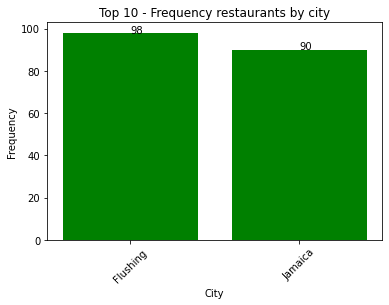

In [182]:
# Get frequency restaurants by city.
cluster_1_freq = cluster_density_1[['location', 'venue']].groupby('location').count().reset_index()
cluster_1_freq = cluster_1_freq.rename(columns = {'venue': 'freq'}, inplace = False)
cluster_1_freq.sort_values(by=["freq"], ascending=False, inplace=True)
cluster_1_freq.head(10)

# Bar chart
cluster_1_top = cluster_1_freq.head(10)
plt.bar(cluster_1_top["location"], cluster_1_top["freq"], color=["green"])
plt.xticks(rotation=45)
plt.title("Top 10 - Frequency restaurants by city")
plt.xlabel("City")
plt.ylabel("Frequency")

for index, value in enumerate(cluster_1_top["freq"]):
    plt.text(index, value, "{:}".format(value))

In [183]:
# Describe
cluster_density_1.describe(include='all')

,location,latitude,longitude,venue,venue_latitude,venue_longitude,venue_category,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,cluster_label,density
count,188,188.000000,188.000000,188,188.000000,188.000000,188,188,188,188,188,188,188,188,188,188,188,188.0,188.000000
unique,2,NaN,NaN,172,NaN,NaN,48,1,2,1,2,2,2,2,2,2,2,NaN,NaN
top,Flushing,NaN,NaN,Dunkin',NaN,NaN,Chinese Restaurant,Chinese Restaurant,Korean Restaurant,Pizza Place,Bakery,Indian Restaurant,Deli / Bodega,Food Truck,Asian Restaurant,Donut Shop,Fried Chicken Joint,NaN,NaN
freq,98,NaN,NaN,8,NaN,NaN,32,188,98,188,98,98,98,98,98,98,98,NaN,NaN
mean,NaN,40.726793,-73.808430,NaN,40.726744,-73.808328,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,46902.721277
std,NaN,0.029916,0.014079,NaN,0.030160,0.014221,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,5625.895480
min,NaN,40.675770,-73.827390,NaN,40.672979,-73.832444,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,41525.700000
25%,NaN,40.701380,-73.820920,NaN,40.701650,-73.821755,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,41525.700000
50%,NaN,40.730410,-73.809680,NaN,40.730131,-73.808877,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,41525.700000
75%,NaN,40.751480,-73.796320,NaN,40.753468,-73.795812,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,52757.700000


### Cluster 2

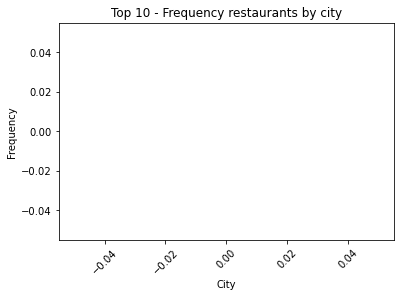

In [196]:
# Filter cluster 2.
cluster_2 = df_merged.loc[df_merged['cluster_label'] == 1]
cluster_density_2 = pd.merge(cluster_2, city_density, on=["location"])

# Get frequency restaurants by city.
cluster_2_freq = cluster_density_2[['location', 'venue']].groupby('location').count().reset_index()
cluster_2_freq = cluster_2_freq.rename(columns = {'venue': 'freq'}, inplace = False)
cluster_2_freq.sort_values(by=["freq"], ascending=False, inplace=True)

# Bar chart
cluster_2_top = cluster_2_freq.head(10)
plt.bar(cluster_2_top["location"], cluster_2_top["freq"], color=["green"])
plt.xticks(rotation=45)
plt.title("Top 10 - Frequency restaurants by city")
plt.xlabel("City")
plt.ylabel("Frequency")

for index, value in enumerate(cluster_2_top["freq"]):
    plt.text(index, value, "{:}".format(value))

### Cluster 3

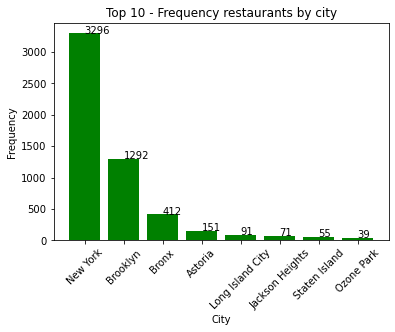

In [197]:
# Filter cluster 3.
cluster_3 = df_merged.loc[df_merged['cluster_label'] == 2]
cluster_density_3 = pd.merge(cluster_3, city_density, on=["location"])

# Get frequency restaurants by city.
cluster_3_freq = cluster_density_3[['location', 'venue']].groupby('location').count().reset_index()
cluster_3_freq = cluster_3_freq.rename(columns = {'venue': 'freq'}, inplace = False)
cluster_3_freq.sort_values(by=["freq"], ascending=False, inplace=True)

# Bar chart
cluster_3_top = cluster_3_freq.head(10)
plt.bar(cluster_3_top["location"], cluster_3_top["freq"], color=["green"])
plt.xticks(rotation=45)
plt.title("Top 10 - Frequency restaurants by city")
plt.xlabel("City")
plt.ylabel("Frequency")

for index, value in enumerate(cluster_3_top["freq"]):
    plt.text(index, value, "{:}".format(value))

In [198]:
# Describe
cluster_density_3.describe(include='all')

,location,latitude,longitude,venue,venue_latitude,venue_longitude,venue_category,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,cluster_label,density
count,5407,5407.000000,5407.000000,5407,5407.000000,5407.000000,5407,5407,5407,5407,5407,5407,5407,5407,5407,5407,5407,5407.0,5.407000e+03
unique,8,NaN,NaN,4155,NaN,NaN,133,5,3,4,6,7,7,8,8,8,7,NaN,NaN
top,New York,NaN,NaN,Dunkin',NaN,NaN,Pizza Place,Italian Restaurant,Pizza Place,Deli / Bodega,Mexican Restaurant,Café,American Restaurant,Restaurant,Bakery,Chinese Restaurant,Sandwich Place,NaN,NaN
freq,3296,NaN,NaN,104,NaN,NaN,431,3296,4924,3387,3387,3296,3387,3296,3296,3296,4588,NaN,NaN
mean,NaN,40.739140,-73.965449,NaN,40.739087,-73.965421,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,1.044150e+06
std,NaN,0.066198,0.043081,NaN,0.066055,0.042960,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,4.798048e+05
min,NaN,40.551520,-74.150380,NaN,40.549539,-74.151117,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,2.641100e+04
25%,NaN,40.706140,-73.996360,NaN,40.707288,-73.994147,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,6.172451e+05
50%,NaN,40.741870,-73.967930,NaN,40.742826,-73.970413,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,1.412008e+06
75%,NaN,40.776010,-73.943960,NaN,40.774919,-73.944230,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,1.412008e+06


### Cluster 4

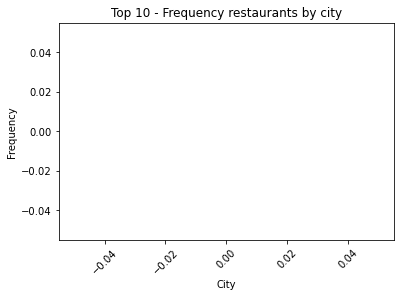

In [199]:
# Filter cluster 4.
cluster_4 = df_merged.loc[df_merged['cluster_label'] == 3]
cluster_density_4 = pd.merge(cluster_4, city_density, on=["location"])

# Get frequency restaurants by city.
cluster_4_freq = cluster_density_4[['location', 'venue']].groupby('location').count().reset_index()
cluster_4_freq = cluster_4_freq.rename(columns = {'venue': 'freq'}, inplace = False)
cluster_4_freq.sort_values(by=["freq"], ascending=False, inplace=True)

# Bar chart
cluster_4_top = cluster_4_freq.head(10)
plt.bar(cluster_4_top["location"], cluster_4_top["freq"], color=["green"])
plt.xticks(rotation=45)
plt.title("Top 10 - Frequency restaurants by city")
plt.xlabel("City")
plt.ylabel("Frequency")

for index, value in enumerate(cluster_4_top["freq"]):
    plt.text(index, value, "{:}".format(value))

For all the K-means results, it has been restricted to the cities with the highest density, thus limiting as much as possible the probabilities of locations where it is convenient to recommend for the opening of the restaurant, in addition to recommending the appropriate categories. The results by cluster are described below.

#### Cluster 1:
In the result of the cluster, it has been restricted to the 10 cities with the highest population density, which is reflected to the cities "Flushing" and "Jamaica" with a frequency of 96 and 90 respectively.
Later you can see the statistical result where the "top" (most common data) turn out to be the city "Flushing" and the locality "Dunkin '".
From the previous result we also have the 10 most common restaurant categories, of which the last 3 are taken into account to mitigate the competition, but at the same time ensuring that it is within the top 10; as a result there are 8th- "Asian Restaurant", 9th- "Donut Shop" and 10th- "Fried Chicken Joint".

#### Cluster 2:
In the result of the cluster, it has been restricted to the 10 cities with the highest population density, of which there are no cities that are within the 10 cities with the highest density, for which there are no results to recommend.

#### Cluster 3:
In the result of the cluster, it has been restricted to the 10 cities with the highest population density, which is reflected to the cities "New York", "Brooklyn", "Bronx", "Astoria", "Long Island City", "Jackson Heights "," Staten Island "and" Ozone Park "with frequencies of 3296, 1292, 412, 151, 91, 71, 55, 39 respectively.
Later you can see the statistical result where the "top" (most common data) turn out to be the city "New York" and the locality "Dunkin '".
From the previous result we also have the 10 most common restaurant categories, of which the last 3 are taken into account to mitigate the competition, but at the same time ensuring that it is within the top 10; as a result we have 8th- "Bakery", 9th- "Chinese Restaurant" and 10th- "Sandwich Place".

#### Cluster 4:
In the result of the cluster, it has been restricted to the 10 cities with the highest population density, of which there are no cities that are within the 10 cities with the highest density, for which there are no results to recommend.


#### Recommendation table

| Cluster | City | Venue | Restaurant Category |
:-|:-:|-:
| Cluster 1 | Flushing | Dunkin' | *Asian Restaurant -> Donut Shop -> Fried Chicken Joint* |
| Cluster 2 | NaN | NaN | *NaN* |
| Cluster 3 | New York | Dunkin' | *Bakery -> Chinese Restaurant -> Sandwich Place* |
| Cluster 4 | NaN | NaN | *NaN* |

## Conclusion <a name="conclusion"></a>

The objective of the project is to recommend the appropriate location to create a new restaurant in New York State, in order to guarantee the success of the business.
Besides, it is also recommended that types of restaurants are suitable options, considering the restriction on the 10 cities with the highest population density. After finishing the corresponding stages of the project, it is concluded that our client can open his restaurant, taking into account the following recommendation:

State: New York

Cities: Flushing, New York

Types of restaurant:

In the city of "Flushing":

* 1st. option: "Fried Chicken Joint"
* 2nd. option: "Donut Shop"
* 3rd. option: "Asian Restaurant"

In the city of "New York":

* 1st. option: "Sandwich Place"
* 2nd. option: "Chinese Restaurant"
* 3rd. option: "Bakery"